## Imports

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio
from rasterio import plot #essential to plot images in BNG, in correct posiiton, and full RGB 
import matplotlib.pyplot as plt

pd.set_option('display.max_column', 100) #set max number of cols to display before ...
%matplotlib inline

## OSMM Topography Area

In [3]:
#set path
M20Area_path = r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Vector\M201AB\M201AB_SJ8493\M201AB_SJ8493.shp"
M20Area = gpd.read_file(M20Area_path)
#M20Area.head()

<Axes: >

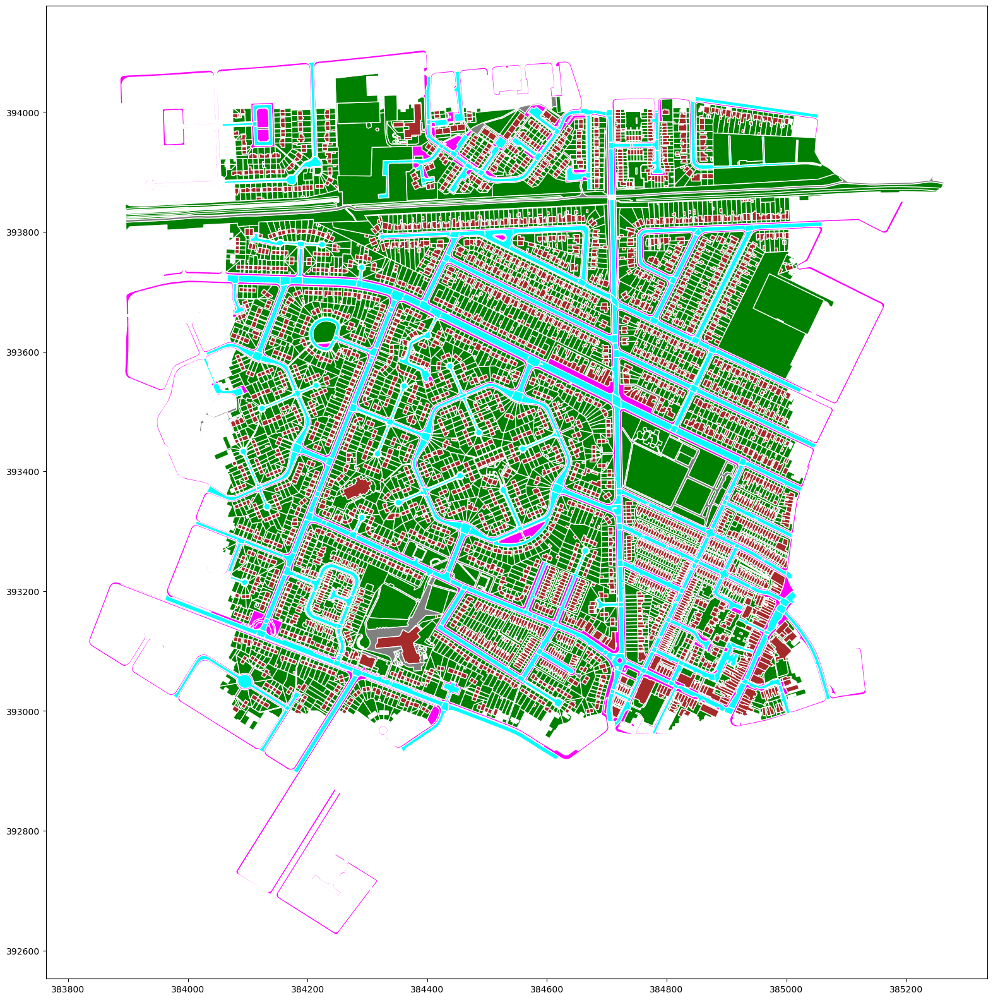

In [16]:
base = M20Area.query("Theme == 'Land'").plot(figsize = (20,20), color = 'green', edgecolor = 'white')
M20Area.query("Theme == 'Buildings'").plot(figsize = (20,20), color = "brown", ax = base, edgecolor = 'white')
M20Area.query("Descriptiv == 'Path'").plot(figsize = (20,20), color = "grey", ax = base, edgecolor = 'white')
M20Area.query("Descriptiv == 'Roadside'").plot(figsize = (20,20), color = "magenta", ax = base, edgecolor = 'white')
M20Area.query("Descriptiv == 'Road Or Track'").plot(figsize = (20,20), color = "cyan", ax = base, edgecolor = 'white')

<Axes: >

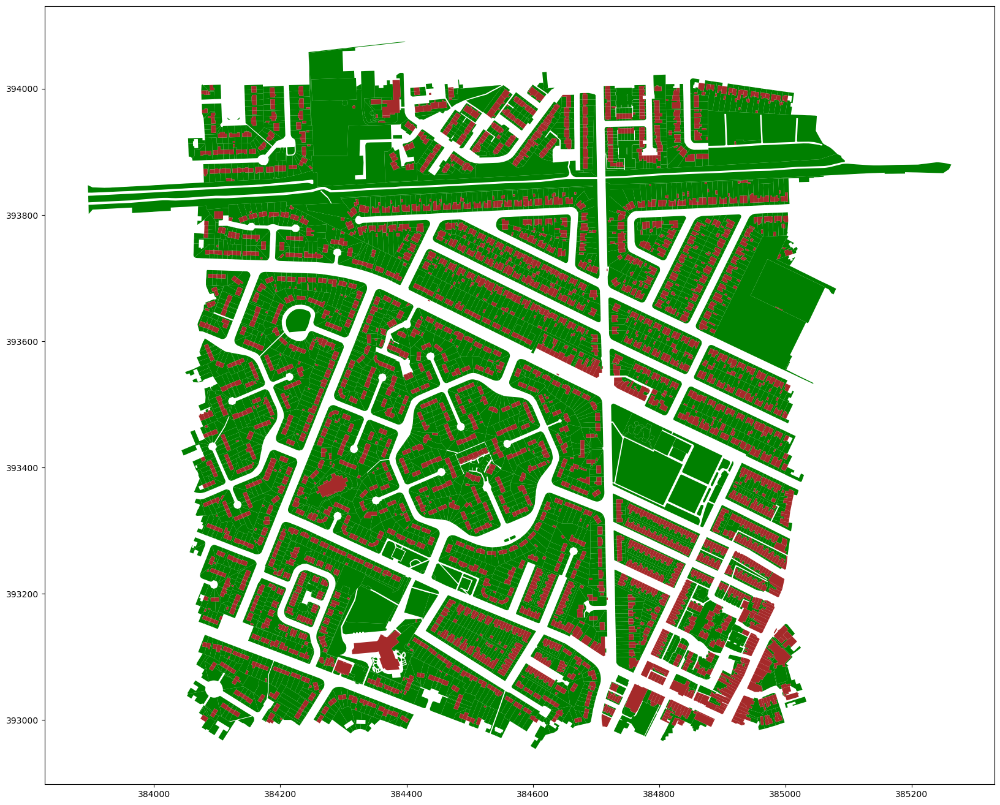

In [17]:
base = M20Area.query("Theme == 'Land'").plot(figsize = (20,20), color = 'green')
M20Area.query("Theme == 'Buildings'").plot(figsize = (20,20), color = "brown", ax = base)

In [8]:
ABMMPath = r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\ABMMmerged.csv"
ABMM = pd.read_csv(ABMMPath)

In [9]:
ABMM.head()

,uprn,classification_code,descriptivegroup,descriptiveterm,theme,calculatedareavalue,wkb_geometry
0,77192263,RD02,{Building},NaN,{Buildings},111.865955,0103000020346C0000010000000A000000CDCCCCCC387E...
1,77192741,RD03,{Building},NaN,{Buildings},45.224046,0103000020346C00000100000009000000FED478696379...
2,77222584,RD04,{Building},NaN,{Buildings},63.928768,0103000020346C0000010000000B000000666666661076...
3,77230739,RD04,{Building},NaN,{Buildings},51.397536,0103000020346C0000010000000C00000033333333B374...
4,77124484,RD04,{Building},NaN,{Buildings},81.888455,0103000020346C00000100000009000000000000008B83...


In [12]:
M20Area.head(100)

,OBJECTID,TOID,FeatureCod,Version,VersionDat,Theme,ThemeCount,Calculated,ChangeDate,ReasonForC,ChangeHist,Descriptiv,Descript_1,Descript_2,Descript_3,Make,PhysicalLe,PhysicalPr,style_code,BHATopoAre,BHAProcess,AbsHMin,AbsH2,AbsHMax,RelH2,RelHMax,BHAConf,Shape_Leng,Shape_Area,geometry,condition_met
0,21553546,osgb1000000253948355,10183,14,2019/09/18 00:00:00.000,Roads Tracks And Paths,1,2260.813349,2019/09/18 00:00:00.000,Restructured,10,Roadside,1,NaN,0,Manmade,50,NaN,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2057.279298,2260.813373,"POLYGON ((384041.100 394067.800, 384042.250 39...",NaN
1,21553595,osgb1000000253948410,10111,11,2021/02/16 00:00:00.000,Land,1,6901.783168,2021/02/11 00:00:00.000,Reclassified,9,Natural Environment,1,Scrub,1,Natural,50,NaN,19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1498.666490,6901.783000,"POLYGON ((384251.900 393868.990, 384252.300 39...",NaN
2,21553669,osgb1000000253948500,10183,11,2019/09/20 00:00:00.000,Roads Tracks And Paths,1,3131.092145,2019/09/20 00:00:00.000,Modified,9,Roadside,1,NaN,0,Manmade,50,NaN,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2306.753788,3131.125346,"POLYGON ((384011.300 393718.900, 384013.550 39...",NaN
3,21553671,osgb1000000253948503,10183,17,2021/02/16 00:00:00.000,Roads Tracks And Paths,1,3155.689688,2021/02/13 00:00:00.000,Modified,15,Roadside,1,NaN,0,Manmade,50,NaN,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2669.161860,3155.689688,"POLYGON ((384707.100 393699.000, 384706.650 39...",NaN
4,21553680,osgb1000000253948516,10183,15,2022/02/22 00:00:00.000,Roads Tracks And Paths,1,2198.989477,2022/02/22 00:00:00.000,Restructured,10,Roadside,1,NaN,0,Manmade,50,NaN,39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2653.249262,2199.006360,"POLYGON ((384106.250 393590.050, 384108.450 39...",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,21584120,osgb1000000254189933,10053,3,2019/09/06 00:00:00.000,Land,1,171.904501,2019/09/06 00:00:00.000,Modified,3,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.071080,171.904500,"POLYGON ((384855.952 393717.651, 384859.001 39...",True
96,21584121,osgb1000000254189934,10053,4,2014/04/23 00:00:00.000,Land,1,186.295148,2014/02/20 00:00:00.000,Modified,3,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,109.054923,186.295148,"POLYGON ((384536.500 393565.850, 384545.950 39...",True
97,21584122,osgb1000000254189935,10053,4,2019/09/06 00:00:00.000,Land,1,156.989081,2019/09/06 00:00:00.000,Modified,4,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.001086,156.989081,"POLYGON ((384900.200 393710.500, 384916.750 39...",True
98,21584123,osgb1000000254189937,10053,3,2014/12/04 00:00:00.000,Land,1,63.948665,2014/11/28 00:00:00.000,Modified,3,General Surface,1,Multi Surface,1,Multiple,50,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,43.783553,63.948665,"POLYGON ((384906.750 393778.999, 384908.117 39...",True


In [ ]:
merged_df = pd.merge(M20Area, ABMM, on='common_id', how='inner')

## Topography Line

In [18]:
#set path to etopoLine_1980
m20Line_path = r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Vector\M201AB\M201AB_SJ8493\M201ABLine_SJ8493.shp"
m20Line = gpd.read_file(m20Line_path)

<Axes: >

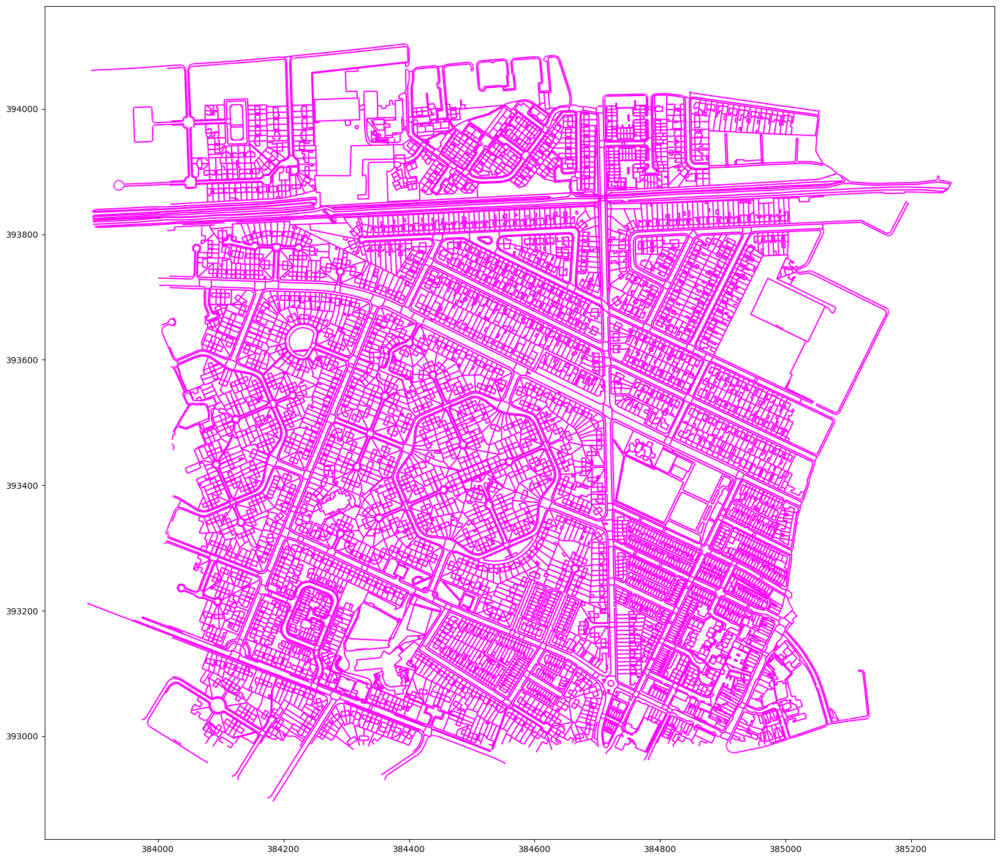

In [19]:
m20Line.plot(figsize=(20,20), color = "magenta")

## Load in APGB

In [20]:
m20AP_path = r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Raster\M201AB\120412_20230807\25cm Aerial Photo\120412-2_RGB\SJ8493.tif"
src = rasterio.open(m20AP_path)
print("path: ", src.name, "\nmode: ", src.mode, "\nis closed?: ", src.closed
      , "\nband count: ", src.count, "\nshape: ", src.shape, "\nprofile: ", src.profile)


path:  C:/Users/Inateck/Documents/parking_provision/off_street_parking/Raster/M201AB/120412_20230807/25cm Aerial Photo/120412-2_RGB/SJ8493.tif 
mode:  r 
is closed?:  False 
band count:  3 
shape:  (4000, 4000) 
profile:  {'driver': 'GTiff', 'dtype': 'uint8', 'nodata': None, 'width': 4000, 'height': 4000, 'count': 3, 'crs': CRS.from_wkt('PROJCS["OSGB36 / British National Grid",GEOGCS["OSGB36",DATUM["Ordnance_Survey_of_Great_Britain_1936",SPHEROID["Airy 1830",6377563.396,299.324975315035,AUTHORITY["EPSG","7001"]],AUTHORITY["EPSG","6277"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4277"]],PROJECTION["Transverse_Mercator"],PARAMETER["latitude_of_origin",49],PARAMETER["central_meridian",-2],PARAMETER["scale_factor",0.9996012717],PARAMETER["false_easting",400000],PARAMETER["false_northing",-100000],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["EPSG","27700"]]'), 'transform': Affine(0.2

<Axes: >

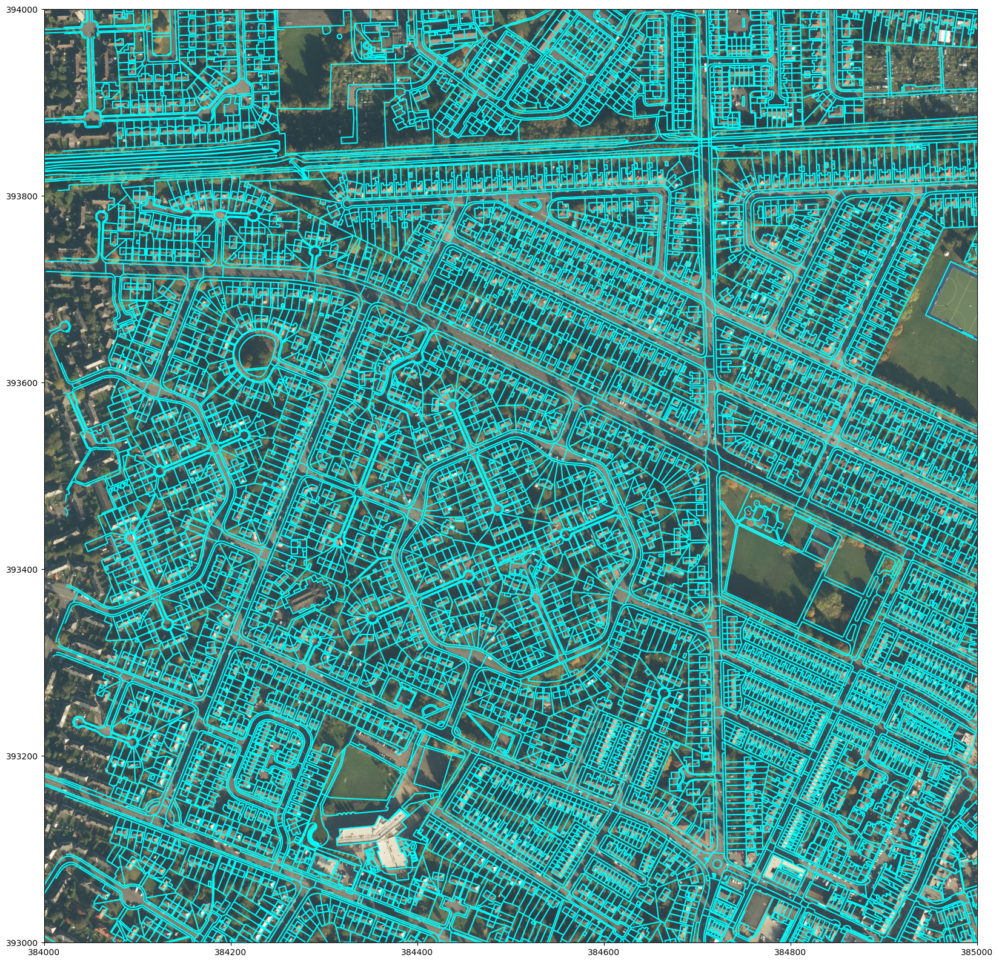

In [26]:
base = m20Line.plot(figsize=(20,20), color = "cyan") #uses gpd plot method
plot.show(src, ax = base) #uses rasterio plot module

## Isolate Garden Polygons

In [5]:
## Identify polygons with 'descriptiv' value of 'general surface'
general_surface_polygons = M20Area[M20Area['Descriptiv'] == 'General Surface']

# Create a function to check if a polygon shares a border with two specific 'descriptiv' values
def has_required_neighbors(polygon, gdf, target_values, required_count):
    neighbors = M20Area[M20Area.geometry.touches(polygon.geometry)]
    count = neighbors['Descriptiv'].isin(target_values).sum()
    return count >= required_count

# Create a new column with True/False values based on the condition
target_values = ['Roadside', 'Building']
required_count = 2
M20Area['condition_met'] = general_surface_polygons.apply(
    lambda row: has_required_neighbors(row, M20Area, target_values, required_count),
    axis=1
)

<Axes: >

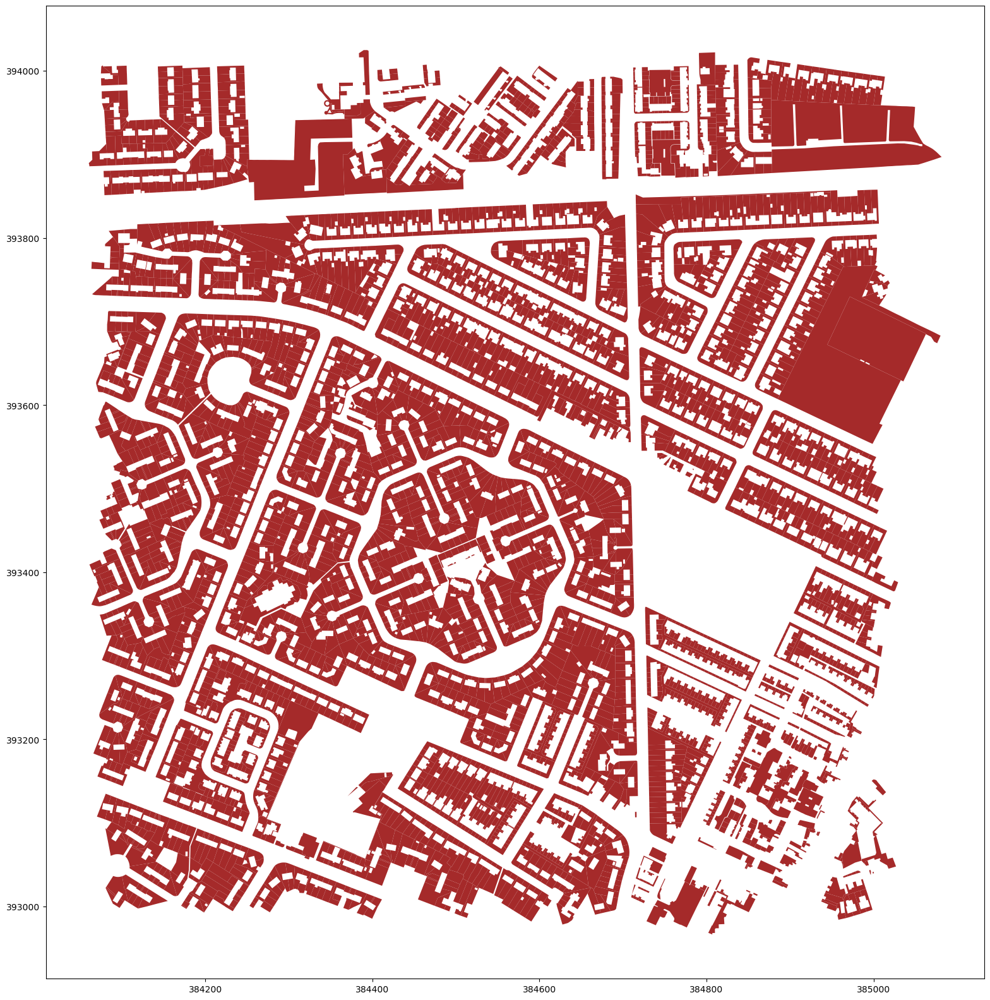

In [21]:
M20Area.query("condition_met == True").plot(figsize=(20,20), color = "brown")

<Axes: >

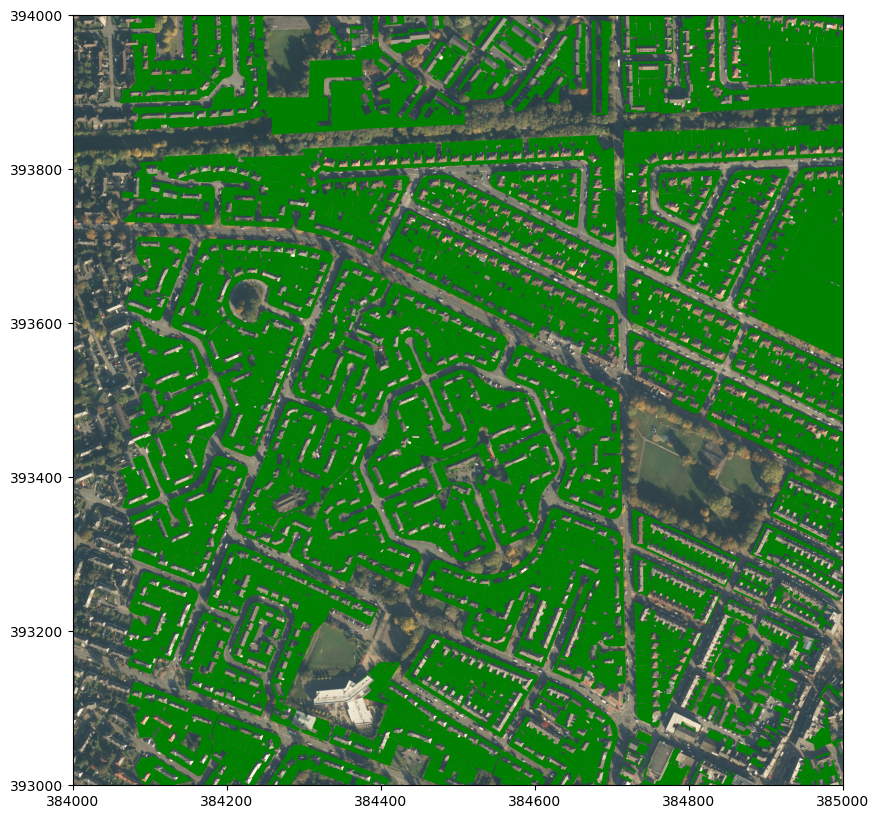

In [22]:
base = M20Area.query("condition_met == True").plot(figsize=(10,10),color = 'green')
plot.show(src, ax = base) #uses rasterio plot module

In [24]:
M20Area_PG = M20Area.query("condition_met == True")

In [28]:
M20Area_PG.to_file(r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Jigsaw\M20Area_PG.shp")

C:\Users\Inateck\AppData\Local\Temp\ipykernel_8564\174512816.py:1: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  M20Area_PG.to_file(r"C:\Users\Inateck\Documents\parking_provision\off_street_parking\Jigsaw\M20Area_PG.shp")
